#Inspect model architectures

In [ ]:
import torch
import torchvision.models as models

# Load MobileNetV2
mobilenet_v2 = models.mobilenet_v2(pretrained=None)
print("\nMobileNetV2 Model Structure:")
print(mobilenet_v2)




MobileNetV2 Model Structure:
MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
     

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [ ]:
# Load ResNet50
resnet50 = models.resnet50(pretrained=None)
print("\nResNet50 Model Structure:")
print(resnet50)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)



ResNet50 Model Structure:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kern

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
#sums up the number of elements in parameters that require gradients - learnable parameters

mobilenet_v2_params = count_parameters(mobilenet_v2)
resnet50_params = count_parameters(resnet50)

print("\n--- Model Parameters --- ")
print(f"| Model          | Parameters   |")
print(f"|----------------|--------------|")
print(f"| MobileNetV2    | {mobilenet_v2_params:<12,} |")
print(f"| ResNet50       | {resnet50_params:<12,} |")
print(f"--------------------------------")


--- Model Parameters --- 
| Model          | Parameters   |
|----------------|--------------|
| MobileNetV2    | 3,504,872    |
| ResNet50       | 25,557,032   |
--------------------------------


#Augmentations of Lightly module for SimCLR

In [ ]:
!pip install lightly


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 859.3/859.3 kB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.6/165.6 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.5/849.5 kB 48.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 39.7 MB/s eta 0:00:00


In [ ]:
from lightly.data import LightlyDataset
from lightly.transforms import SimCLRTransform
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

In [ ]:
data_path = '/content/drive/MyDrive/pets0/val'
# SimCLR Transform from lightly
simclr_transform = SimCLRTransform(input_size=224)  # you can change input_size as needed

# Custom dataset to return 2 views
class SimCLRDataset(ImageFolder):
    def __getitem__(self, index):
        sample, _ = super().__getitem__(index)
        xi, xj = simclr_transform(sample)
        return xi, xj

# Create dataset and dataloader
dataset = SimCLRDataset(root=data_path)
#dataloader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=2)
num_imgs = len(dataset)
print(f"Number of images in the dataset: {num_imgs}")

Number of images in the dataset: 180


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import torchvision
import torchvision.transforms.functional as TF

def visualize_transform(dataset, i, j):
  # Get the path to a sample image from the dataset
  sample_image_path = dataset.samples[i][j]

  # Load the original image
  original_image = Image.open(sample_image_path).convert('RGB')

  # Apply the SimCLR transform to get two augmented views
  xi, xj = simclr_transform(original_image)

  # Convert tensors back to PIL Images for display
  to_pil = torchvision.transforms.ToPILImage()
  xi_pil = to_pil(xi)
  xj_pil = to_pil(xj)

  # Plot the images
  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  axes[0].imshow(original_image)
  axes[0].set_title('Original Image')
  axes[0].axis('off')

  axes[1].imshow(xi_pil)
  axes[1].set_title('Augmented View 1 (xi)')
  axes[1].axis('off')

  axes[2].imshow(xj_pil)
  axes[2].set_title('Augmented View 2 (xj)')
  axes[2].axis('off')

  plt.tight_layout()
  plt.show()

Found 90 dog images.
Visualizing augmented views for a few 'Dog' images:


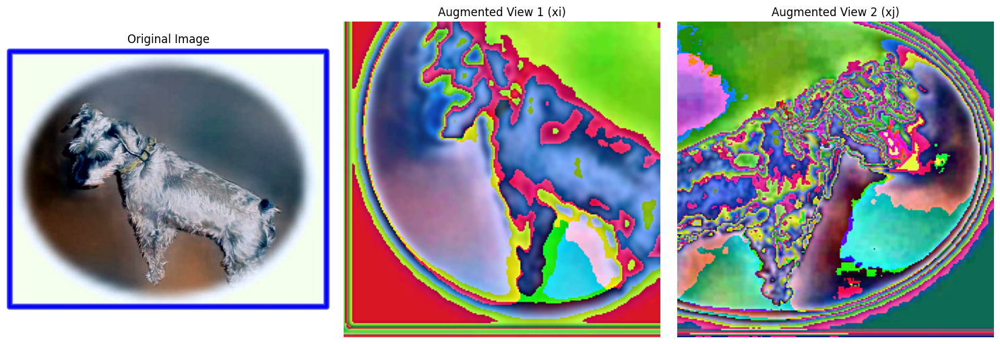

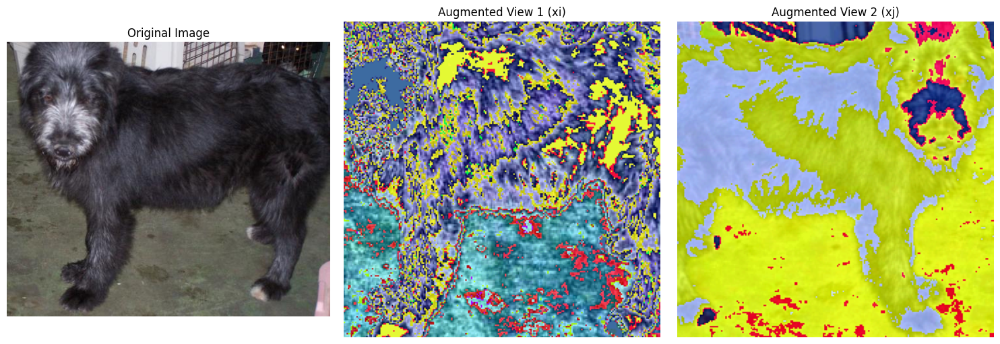

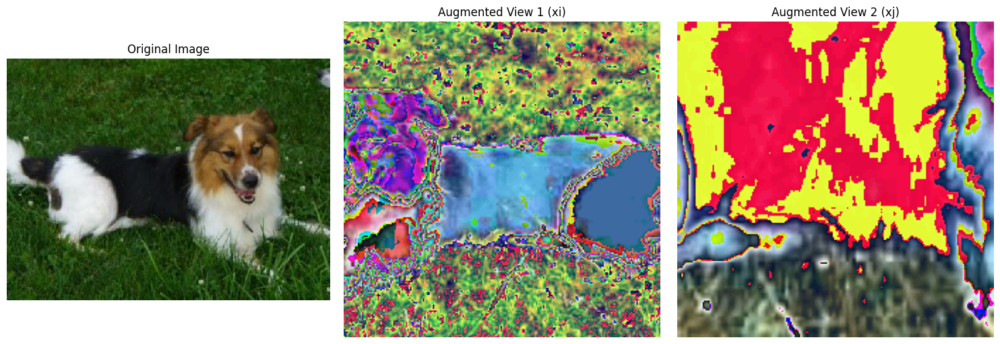

In [ ]:
# Get the class index for 'Dog'
dog_class_idx = dataset.class_to_idx['Dog']

# Filter samples to get only 'Dog' images
dog_samples_indices = [i for i, (path, label) in enumerate(dataset.samples) if label == dog_class_idx]

print(f"Found {len(dog_samples_indices)} dog images.")

# Visualize a few 'Dog' images
print("Visualizing augmented views for a few 'Dog' images:")
for count, index in enumerate(dog_samples_indices):
    if count >= 3: # Visualize up to 3 dog images
        break
    visualize_transform(dataset, index, 0)

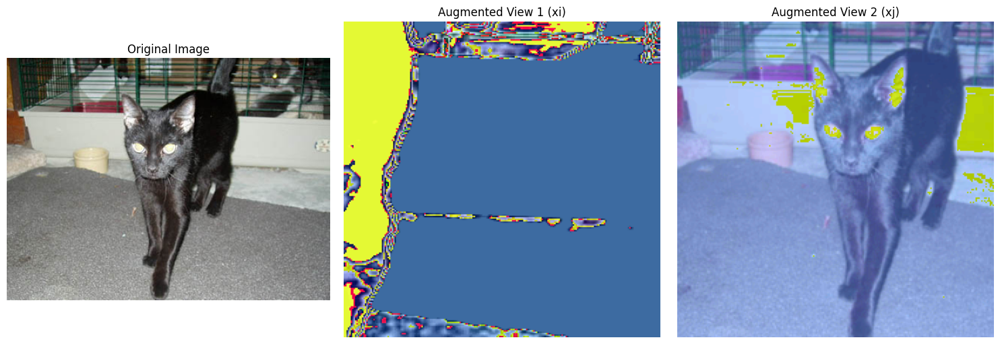

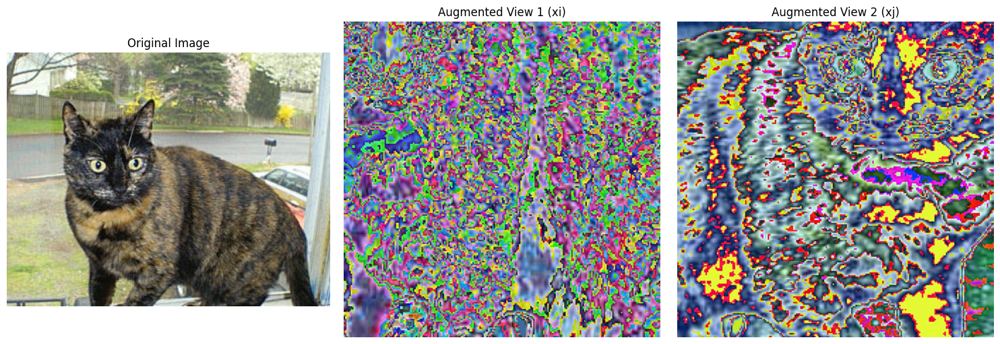

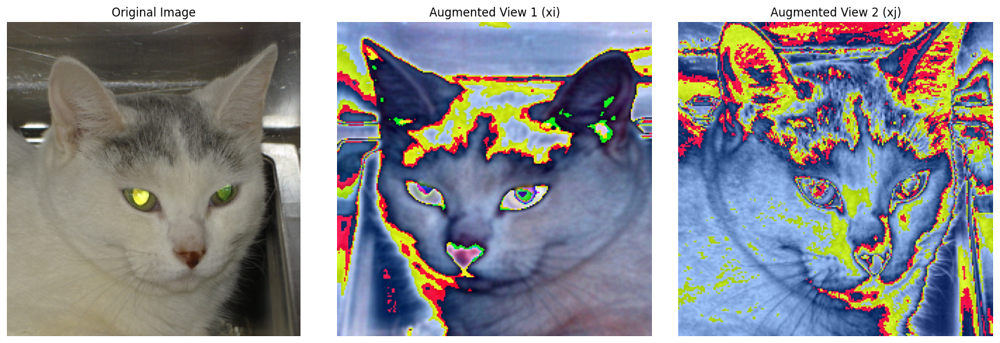

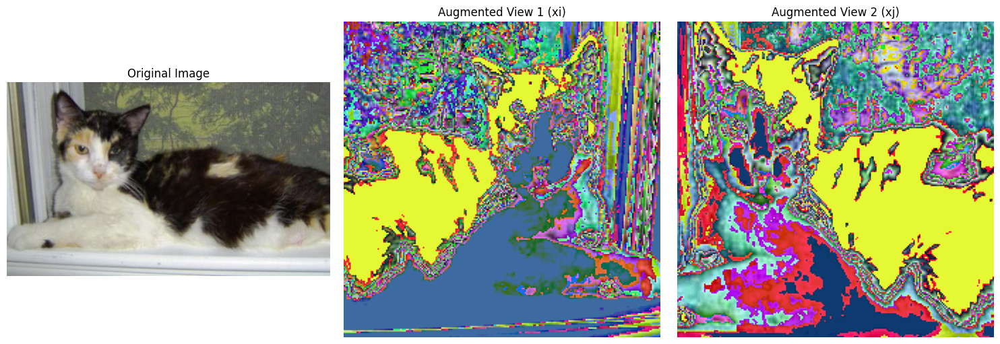

In [ ]:
for i in range(min(4, len(dataset))):
  # Call visualize_transform with the image index (i) and ensure to get the path (0)
  visualize_transform(dataset, i, 0)

We observe heavy color jitter, flips, and random resized crops, and their combination produces some very challenging views.

#Visualize features captured by MobileNetV2 and ResNet50

##Load the finetuned teacher and a distilled student

In [ ]:
import torchvision.models as models
import torch.nn as nn
import torch

# Define the path to your saved finetuned teacher model checkpoint
finetuned_checkpoint_path = '/content/drive/MyDrive/mods/resnet_finetune_only.pth'

# Load a standard ResNet50 model structure
teacher_model = models.resnet50(weights=None) # Load without pretrained ImageNet weights initially

# Modify the final fully connected layer to match the number of classes
num_ftrs = teacher_model.fc.in_features
num_classes = 2  # Your model was finetuned for 2 classes (Cat/Dog)
teacher_model.fc = nn.Linear(num_ftrs, num_classes)


# Load the state dictionary from the saved finetuned teacher model checkpoint
# Using map_location='cpu' to load onto CPU first is safer, then move to device
teacher_state_dict = torch.load(finetuned_checkpoint_path, map_location='cpu')

# Load the state dictionary into the standard ResNet50 model
# This should now work because the model structure matches the saved state_dict
teacher_model.load_state_dict(teacher_state_dict)

# Set the teacher model to evaluation mode
teacher_model.eval()

# Determine the device based on CUDA availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the teacher model to the device
teacher_model = teacher_model.to(device)

print("Finetuned teacher model loaded correctly for testing.")

Finetuned teacher model loaded correctly for testing.


In [ ]:
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F

# Student (MobileNetV2)
student = models.mobilenet_v2(weights=None)
student.classifier[1] = nn.Linear(student.last_channel, 2)  # 2 classes

# Load the state dictionary
simclr_state_dict = torch.load('/content/drive/MyDrive/mods/only_distilled_student_10000_cont.pth', map_location=device)

# Use strict=False if the dict has extra layers we don't wanna load
# strict=True ensures that all keys in the loaded state dictionary must perfectly match the keys in the student's current state.
student.load_state_dict(simclr_state_dict, strict=True)

student = student.to(device)


In [ ]:
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Student (MobileNetV2)
student2 = models.mobilenet_v2(weights=None)
student2.classifier[1] = nn.Linear(student2.last_channel, 2)  # 2 classes

# Load the state dictionary
simclr_state_dict = torch.load('/content/drive/MyDrive/mods/student_finetuned_10000_cont2.pth', map_location=device)

# Use strict=False if the dict has extra layers we don't wanna load
# strict=True ensures that all keys in the loaded state dictionary must perfectly match the keys in the student's current state.
student2.load_state_dict(simclr_state_dict, strict=True)

student2 = student2.to(device)


## Define Feature Extraction Function



In [ ]:
import torch
import torch.nn as nn

def get_feature_maps(model, layer_names):
    feature_maps = {}
    hook_handlers = []

    # Iterate through model modules and register hooks
    for name, module in model.named_modules():
        if name in layer_names:
            # Define a hook_fn that captures the current 'name' and feature_maps dictionary
            def hook_fn(module, input, output, layer_name=name):
                feature_maps[layer_name] = output.detach()  # Detach to avoid retaining graph

            # Register the forward hook
            handler = module.register_forward_hook(hook_fn)
            hook_handlers.append(handler)

    return feature_maps, hook_handlers

print("Feature extraction function 'get_feature_maps' refined and defined.")

Feature extraction function 'get_feature_maps' refined and defined.


## Prepare Input Image



In [ ]:
import torchvision.transforms as transforms
import torch
from PIL import Image

# Define the device here to ensure it's accessible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1. Select a sample image path from the dataset
# The dataset.samples attribute is a list of tuples, where each tuple contains (image_path, class_index).
# We want the image_path, which is the first element of the tuple.
sample_image_path = dataset.samples[0][0]

# 2. Load the image using PIL.Image.open() and convert it to RGB.
original_image_pil = Image.open(sample_image_path).convert('RGB')

# 3. Define a torchvision.transforms.Compose pipeline
preprocess_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 4. Apply this transformation pipeline to the loaded image.
input_image_tensor = preprocess_transform(original_image_pil)

# 5. Add a batch dimension to the transformed image tensor.
input_batch = input_image_tensor.unsqueeze(0);

# 6. Move the prepared input image to the appropriate device.
input_batch = input_batch.to(device)

print(f"Sample image loaded from: {sample_image_path}")
print(f"Preprocessed image tensor shape: {input_batch.shape}")
print(f"Image moved to device: {input_batch.device}")

Sample image loaded from: /content/drive/MyDrive/pets/val/Cat/10222.jpg
Preprocessed image tensor shape: torch.Size([1, 3, 224, 224])
Image moved to device: cpu


##Select specific intermediate layers


In [ ]:
import torch
import torch.nn as nn

# Identify intermediate layers for MobileNetV2
# We can inspect the model structure to pick representative layers
# e.g., 'features.0' (initial conv), 'features.6' (middle inverted residual block), 'features.18' (final conv block)
layer_names_mobilenet = [
    'features.0.2', # First ReLU6 after initial Conv2dNormActivation
    'features.6.conv.2', # Output of a middle InvertedResidual block's second conv layer (expansion + depthwise)
    'features.13.conv.3', # Output of a deeper InvertedResidual block's final BatchNorm
    'features.18.2' # Final ReLU6 after the last Conv2dNormActivation before the classifier
]

print("Selected MobileNetV2 layers for feature extraction:")
for layer in layer_names_mobilenet:
    print(f"- {layer}")

# Identify intermediate layers for ResNet50
# e.g., 'conv1', 'layer1.2', 'layer2.3', 'layer3.5', 'layer4.2'
layer_names_resnet = [
    'relu', # After the initial conv1 and bn1
    'layer1.2.relu', # Output of the third bottleneck block in layer1
    'layer2.3.relu', # Output of the fourth bottleneck block in layer2
    'layer3.5.relu', # Output of the sixth bottleneck block in layer3
    'layer4.2.relu'  # Output of the third bottleneck block in layer4
]

print("\nSelected ResNet50 layers for feature extraction:")
for layer in layer_names_resnet:
    print(f"- {layer}")


Selected MobileNetV2 layers for feature extraction:
- features.0.2
- features.6.conv.2
- features.13.conv.3
- features.18.2

Selected ResNet50 layers for feature extraction:
- relu
- layer1.2.relu
- layer2.3.relu
- layer3.5.relu
- layer4.2.relu


## Confirm Loaded Models

In [ ]:
import torch.nn as nn

# Ensure student model is in eval mode
student.eval()

# Ensure teacher model is in eval mode (already done in its loading cell, but good to confirm)
teacher_model.eval()

# Verify models are on the correct device and in evaluation mode
print(f"\n--- Model Status ---")
print(f"Student (MobileNetV2) loaded: {isinstance(student, nn.Module)}")
print(f"Student (MobileNetV2) on device: {next(student.parameters()).device}")
print(f"Student (MobileNetV2) in eval mode: {not student.training}")

print(f"\nTeacher (ResNet50) loaded: {isinstance(teacher_model, nn.Module)}")
print(f"Teacher (ResNet50) on device: {next(teacher_model.parameters()).device}")
print(f"Teacher (ResNet50) in eval mode: {not teacher_model.training}")

print("\nBoth student and teacher models are confirmed loaded, set to evaluation mode, and on the correct device.")


--- Model Status ---
Student (MobileNetV2) loaded: True
Student (MobileNetV2) on device: cpu
Student (MobileNetV2) in eval mode: True

Teacher (ResNet50) loaded: True
Teacher (ResNet50) on device: cpu
Teacher (ResNet50) in eval mode: True

Both student and teacher models are confirmed loaded, set to evaluation mode, and on the correct device.


## Extract and Visualize Features for MobileNetV2 Distilled

In [ ]:
import torch

# 1. Use the get_feature_maps function with the student model and layer_names_mobilenet
mobilenet_feature_maps, mobilenet_hook_handlers = get_feature_maps(student, layer_names_mobilenet)

# 2. Pass the input_batch through the student model to trigger the forward hooks
with torch.no_grad():
    _ = student(input_batch)

# 3. Remove the registered hooks
for handler in mobilenet_hook_handlers:
    handler.remove()

print("Feature maps extracted for MobileNetV2 layers.")
print(f"Extracted layers: {list(mobilenet_feature_maps.keys())}")


Feature maps extracted for MobileNetV2 layers.
Extracted layers: ['features.0.2', 'features.6.conv.2', 'features.13.conv.3', 'features.18.2']



--- Visualizing Feature Maps for MobileNetV2 ---


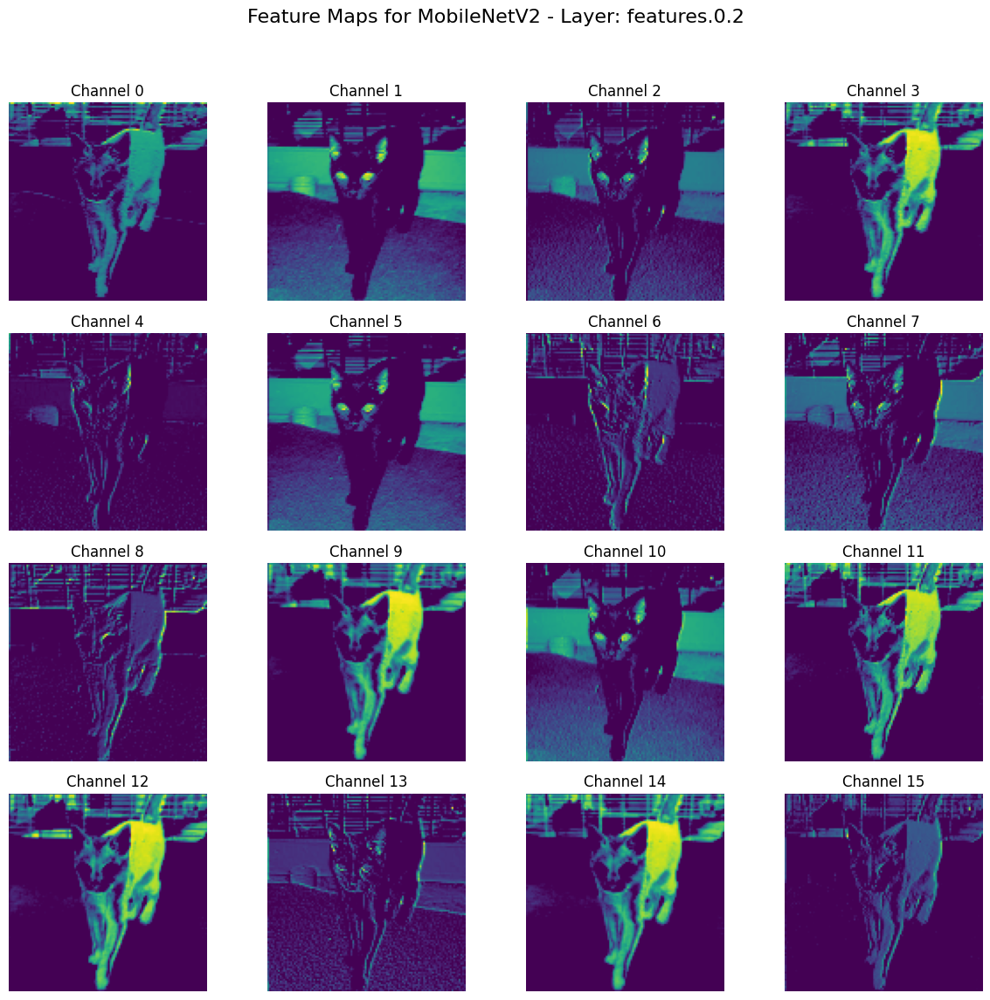

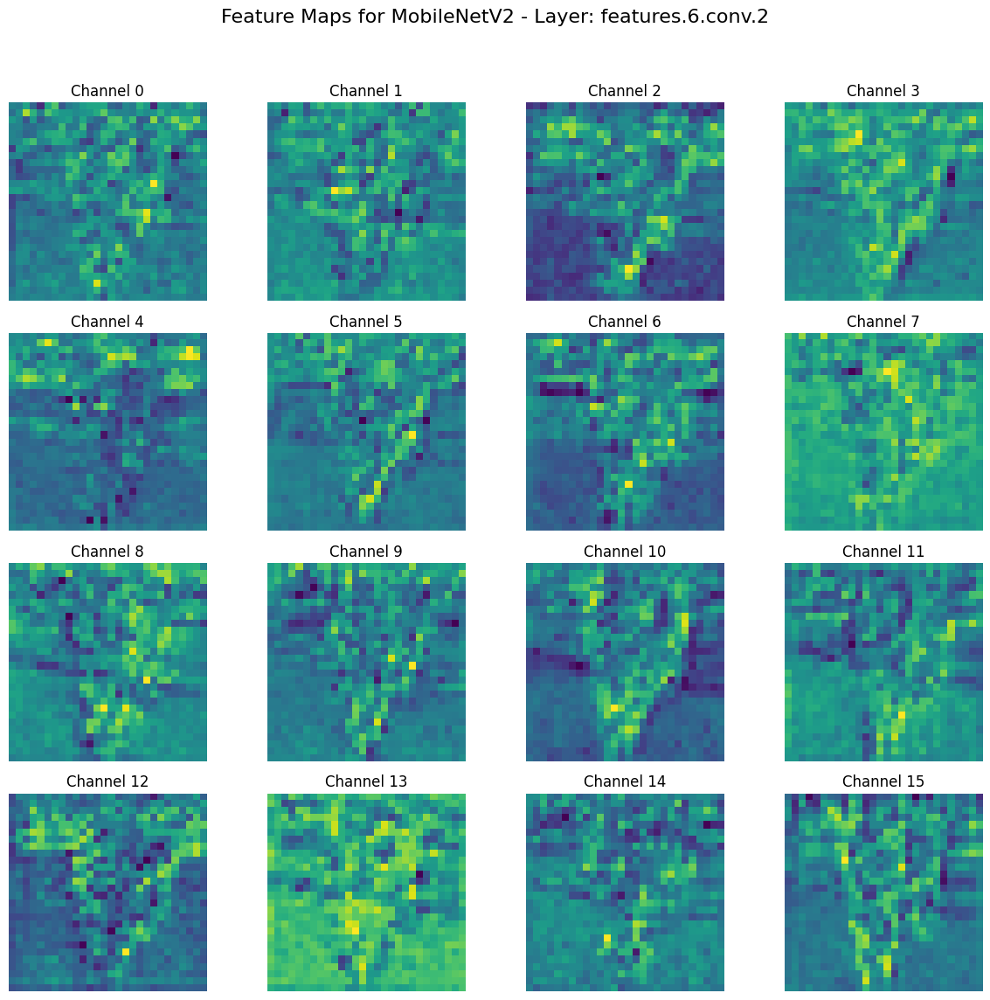

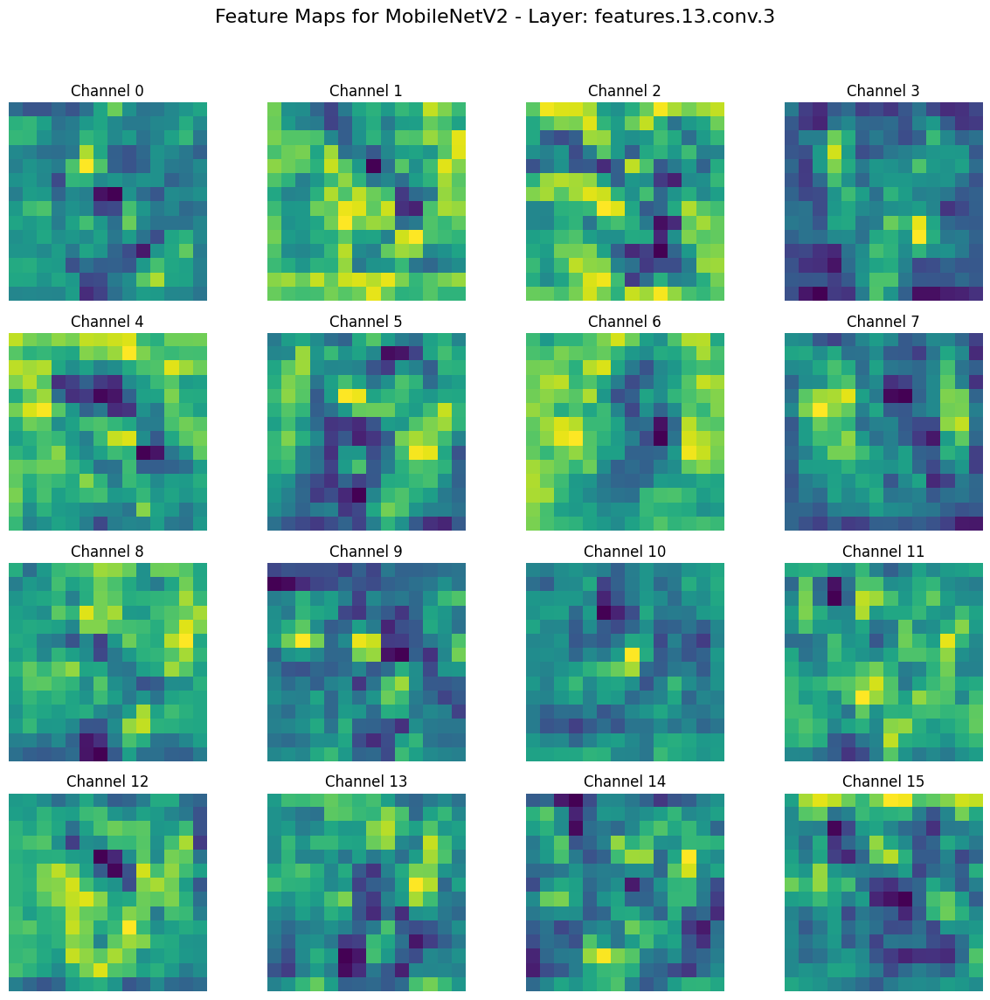

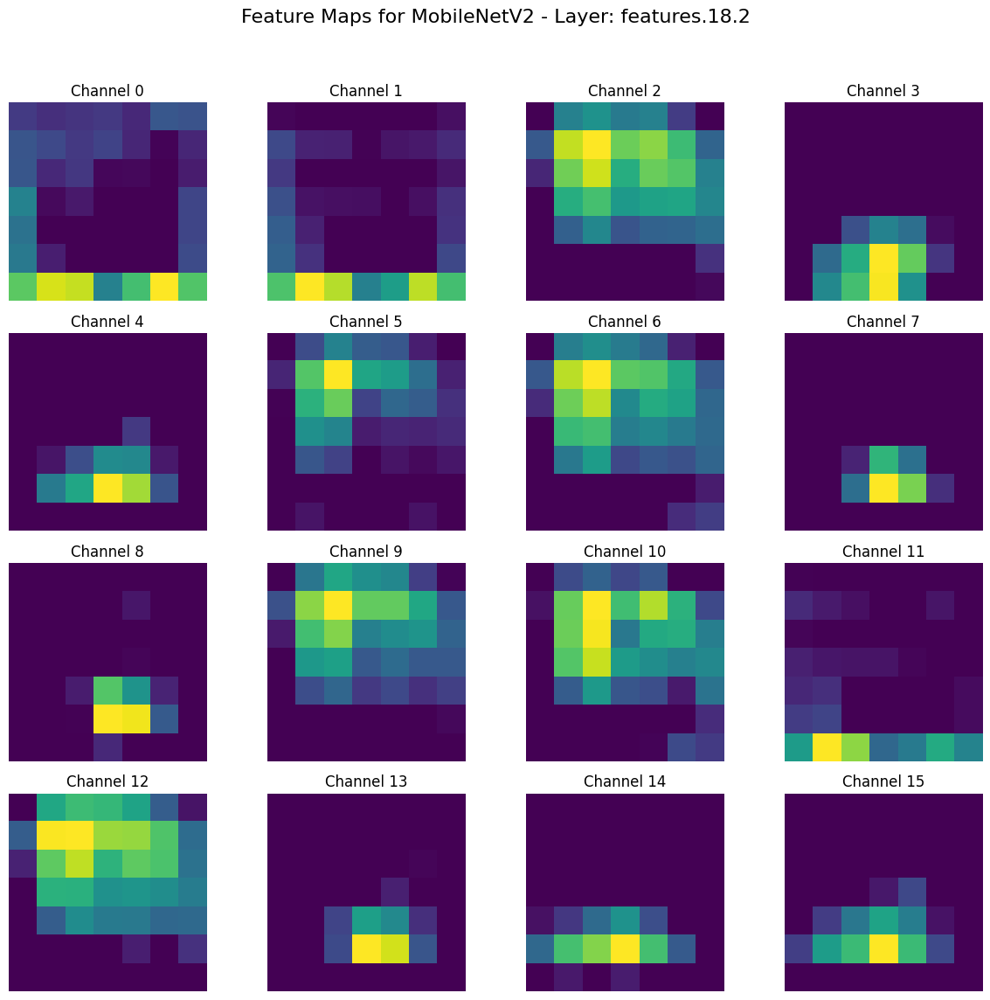

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_feature_maps(feature_maps, model_name):
    print(f"\n--- Visualizing Feature Maps for {model_name} ---")
    for layer_name, feature_map in feature_maps.items():
        # Move to CPU and convert to NumPy array
        fm_np = feature_map.squeeze(0).cpu().numpy() # Remove batch dimension

        num_channels = fm_np.shape[0]
        # Select up to 16 channels to visualize, or fewer if the layer has less
        channels_to_display = min(num_channels, 16)

        # Calculate grid size for subplots
        # If channels_to_display is 1, rows=1, cols=1
        # If channels_to_display is 8, rows=2, cols=4
        # If channels_to_display is 16, rows=4, cols=4
        if channels_to_display == 0:
            print(f"  Layer {layer_name}: No channels to display (empty feature map).")
            continue

        rows = int(np.ceil(channels_to_display / 4))
        cols = min(channels_to_display, 4)

        fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
        fig.suptitle(f'Feature Maps for {model_name} - Layer: {layer_name}', fontsize=16)

        # Flatten axes array for easy iteration, especially for 1xN or Nx1 cases
        if rows == 1 and cols == 1:
            axes_flat = [axes]
        elif rows == 1 or cols == 1:
            axes_flat = axes
        else:
            axes_flat = axes.flatten()

        for i in range(channels_to_display):
            ax = axes_flat[i]
            channel_map = fm_np[i]

            # Normalize feature map to [0, 1] for visualization
            # Handle cases where min/max might be the same (e.g., all zeros)
            min_val = channel_map.min()
            max_val = channel_map.max()
            if max_val == min_val:
                normalized_map = np.zeros_like(channel_map) # All zeros or all same value
            else:
                normalized_map = (channel_map - min_val) / (max_val - min_val)

            ax.imshow(normalized_map, cmap='viridis') # Using viridis for better visibility of gradients
            ax.set_title(f'Channel {i}')
            ax.axis('off')

        # Turn off any unused subplots
        for i in range(channels_to_display, len(axes_flat)):
            fig.delaxes(axes_flat[i])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make room for suptitle
        plt.show()

# Visualize MobileNetV2 feature maps
visualize_feature_maps(mobilenet_feature_maps, 'MobileNetV2')


## Extract and Visualize Features for Student SimCLR


In [ ]:
import torch

# 1. Use the get_feature_maps function with the student model and layer_names_mobilenet
mobilenet_feature_maps, mobilenet_hook_handlers = get_feature_maps(student2, layer_names_mobilenet)

# 2. Pass the input_batch through the student model to trigger the forward hooks
with torch.no_grad():
    _ = student2(input_batch)

# 3. Remove the registered hooks
for handler in mobilenet_hook_handlers:
    handler.remove()

print("Feature maps extracted for MobileNetV2 layers.")
print(f"Extracted layers: {list(mobilenet_feature_maps.keys())}")


Feature maps extracted for MobileNetV2 layers.
Extracted layers: ['features.0.2', 'features.6.conv.2', 'features.13.conv.3', 'features.18.2']



--- Visualizing Feature Maps for MobileNetV2 SimCLR ---


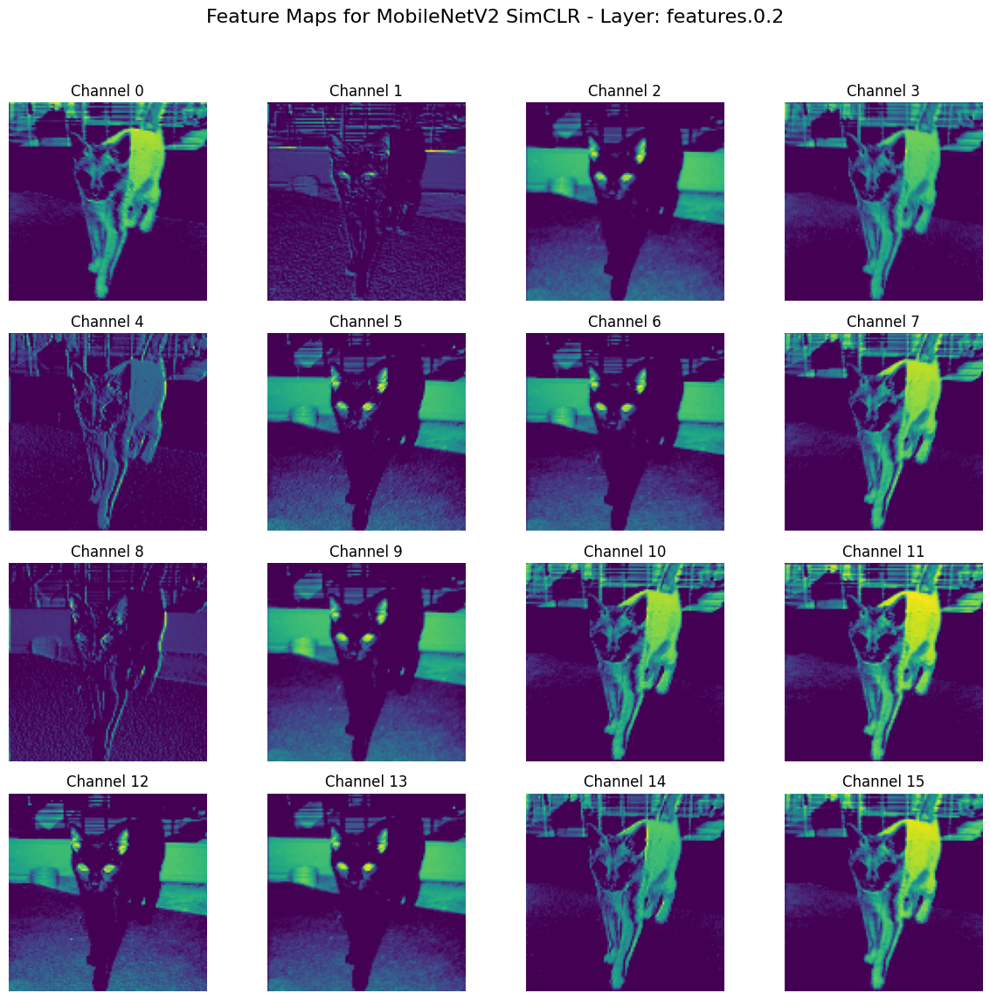

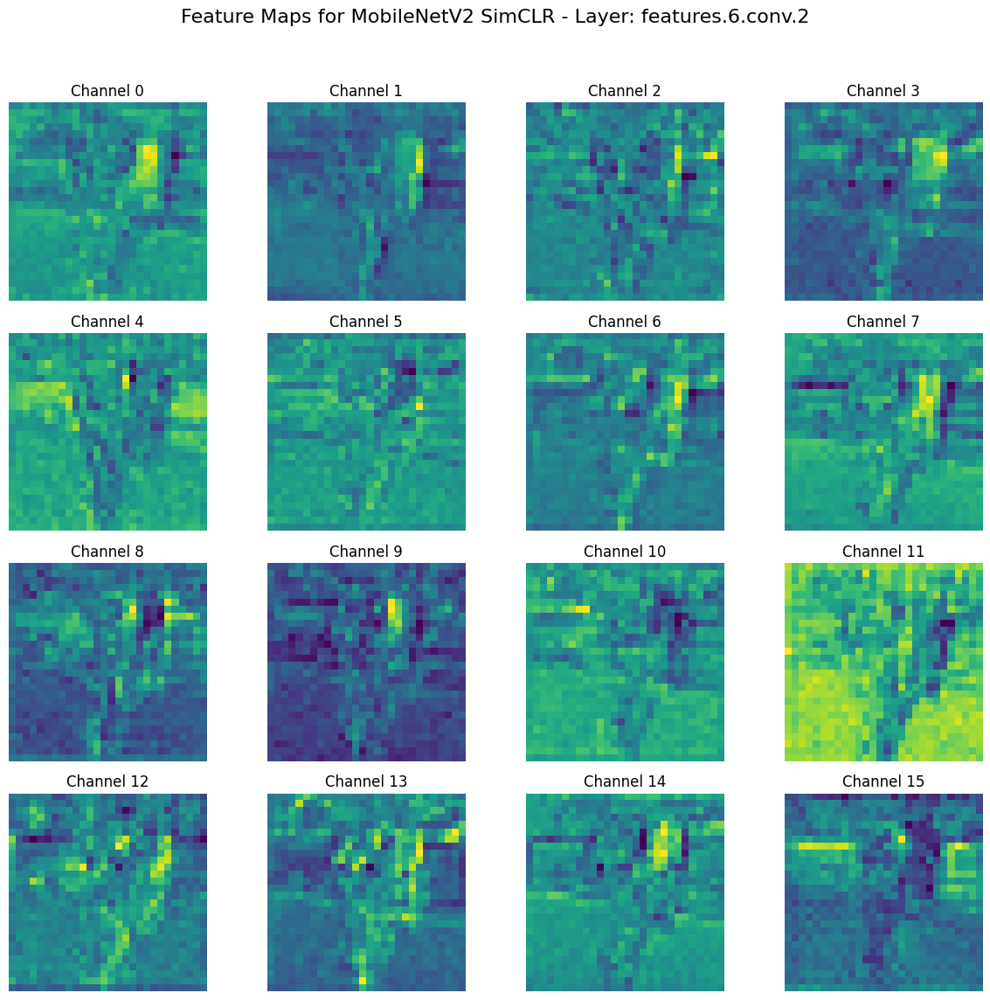

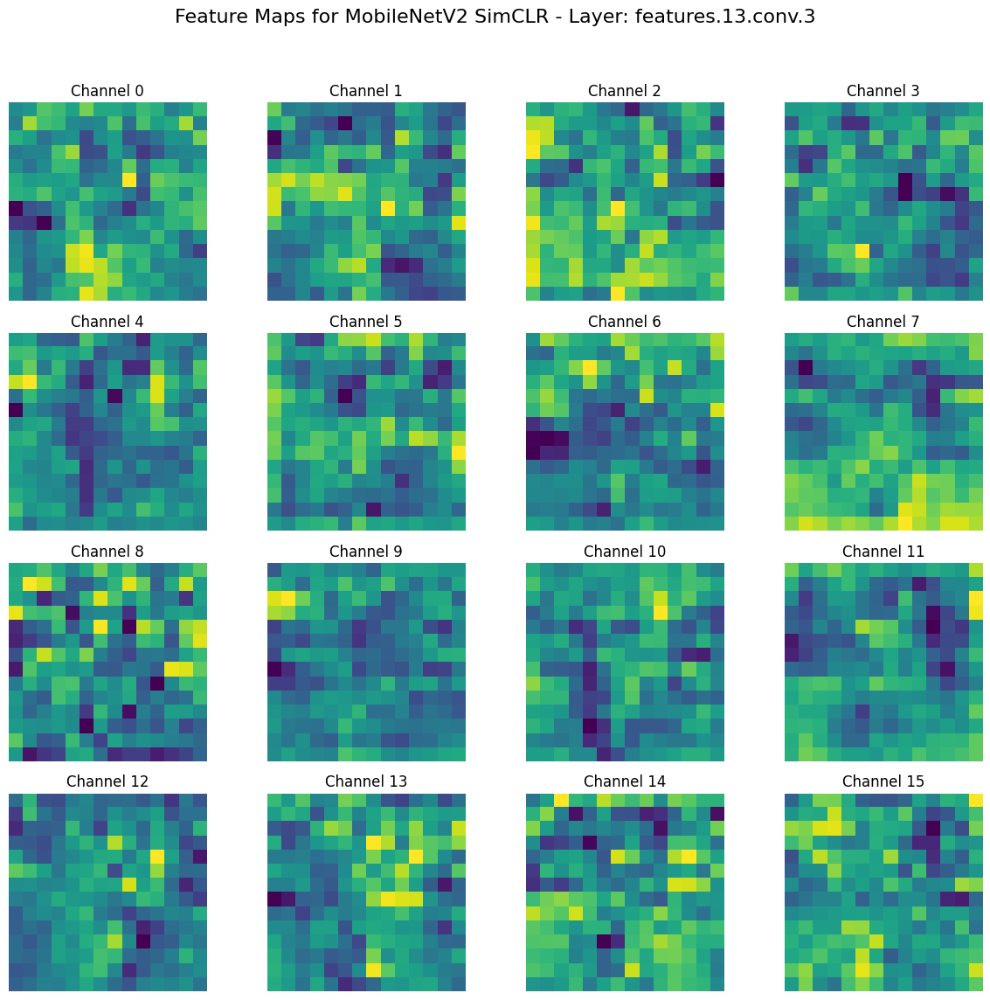

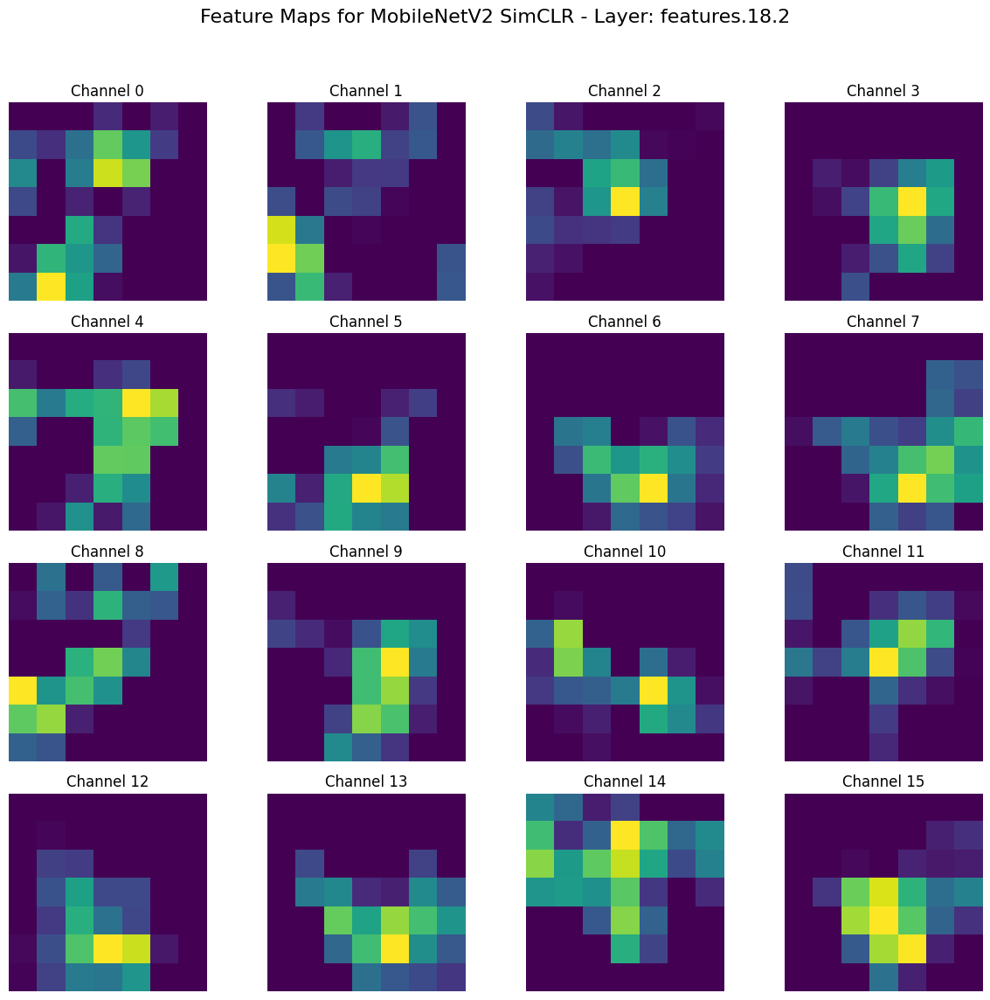

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_feature_maps(feature_maps, model_name):
    print(f"\n--- Visualizing Feature Maps for {model_name} ---")
    for layer_name, feature_map in feature_maps.items():
        # Move to CPU and convert to NumPy array
        fm_np = feature_map.squeeze(0).cpu().numpy() # Remove batch dimension

        num_channels = fm_np.shape[0]
        # Select up to 16 channels to visualize, or fewer if the layer has less
        channels_to_display = min(num_channels, 16)

        # Calculate grid size for subplots
        # If channels_to_display is 1, rows=1, cols=1
        # If channels_to_display is 8, rows=2, cols=4
        # If channels_to_display is 16, rows=4, cols=4
        if channels_to_display == 0:
            print(f"  Layer {layer_name}: No channels to display (empty feature map).")
            continue

        rows = int(np.ceil(channels_to_display / 4))
        cols = min(channels_to_display, 4)

        fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
        fig.suptitle(f'Feature Maps for {model_name} - Layer: {layer_name}', fontsize=16)

        # Flatten axes array for easy iteration, especially for 1xN or Nx1 cases
        if rows == 1 and cols == 1:
            axes_flat = [axes]
        elif rows == 1 or cols == 1:
            axes_flat = axes
        else:
            axes_flat = axes.flatten()

        for i in range(channels_to_display):
            ax = axes_flat[i]
            channel_map = fm_np[i]

            # Normalize feature map to [0, 1] for visualization
            # Handle cases where min/max might be the same (e.g., all zeros)
            min_val = channel_map.min()
            max_val = channel_map.max()
            if max_val == min_val:
                normalized_map = np.zeros_like(channel_map) # All zeros or all same value
            else:
                normalized_map = (channel_map - min_val) / (max_val - min_val)

            ax.imshow(normalized_map, cmap='viridis') # Using viridis for better visibility of gradients
            ax.set_title(f'Channel {i}')
            ax.axis('off')

        # Turn off any unused subplots
        for i in range(channels_to_display, len(axes_flat)):
            fig.delaxes(axes_flat[i])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make room for suptitle
        plt.show()

# Visualize MobileNetV2 feature maps
visualize_feature_maps(mobilenet_feature_maps, 'MobileNetV2 SimCLR')


## Extract and Visualize Features for ResNet50


In [ ]:
import torch

# 1. Use the get_feature_maps function with the teacher_model and layer_names_resnet
resnet_feature_maps, resnet_hook_handlers = get_feature_maps(teacher_model, layer_names_resnet)

# 2. Pass the input_batch through the teacher_model to trigger the forward hooks
with torch.no_grad():
    _ = teacher_model(input_batch)

# 3. Remove the registered hooks
for handler in resnet_hook_handlers:
    handler.remove()

print("Feature maps extracted for ResNet50 layers.")
print(f"Extracted layers: {list(resnet_feature_maps.keys())}")

Feature maps extracted for ResNet50 layers.
Extracted layers: ['relu', 'layer1.2.relu', 'layer2.3.relu', 'layer3.5.relu', 'layer4.2.relu']



--- Visualizing Feature Maps for ResNet50 ---


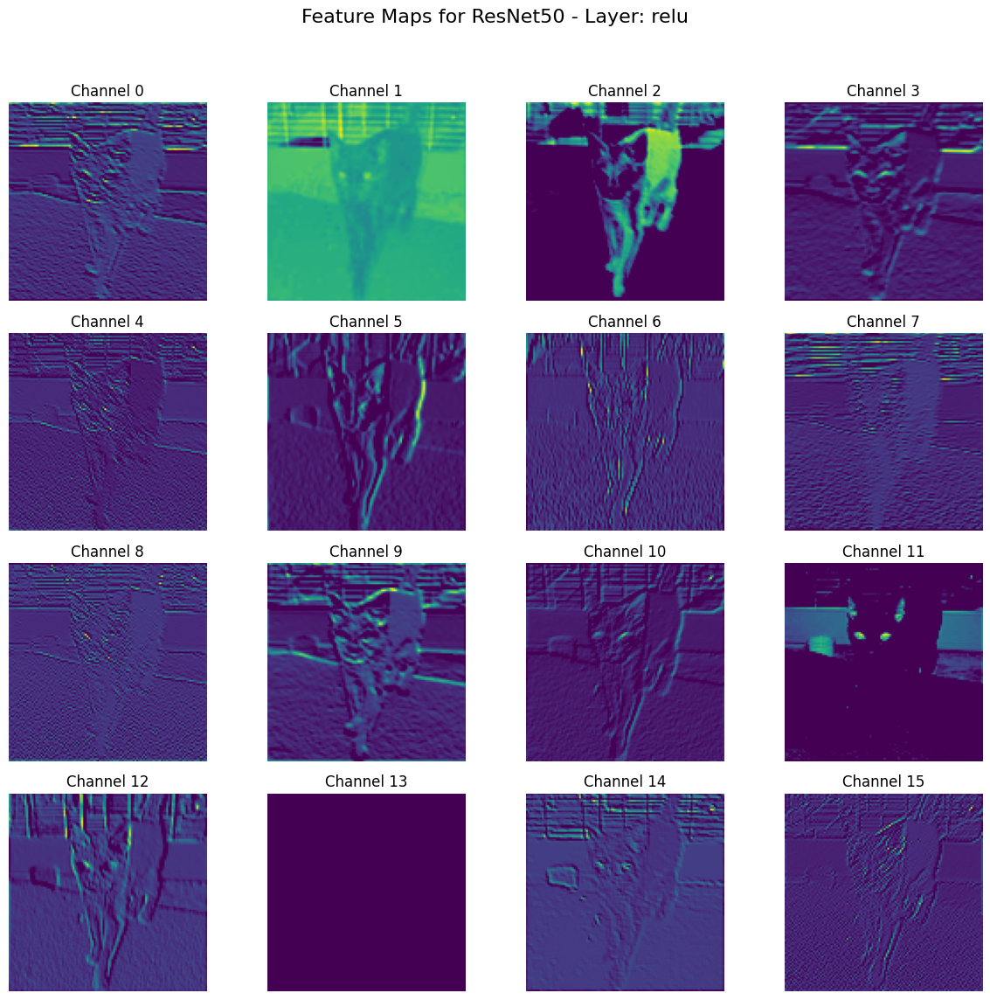

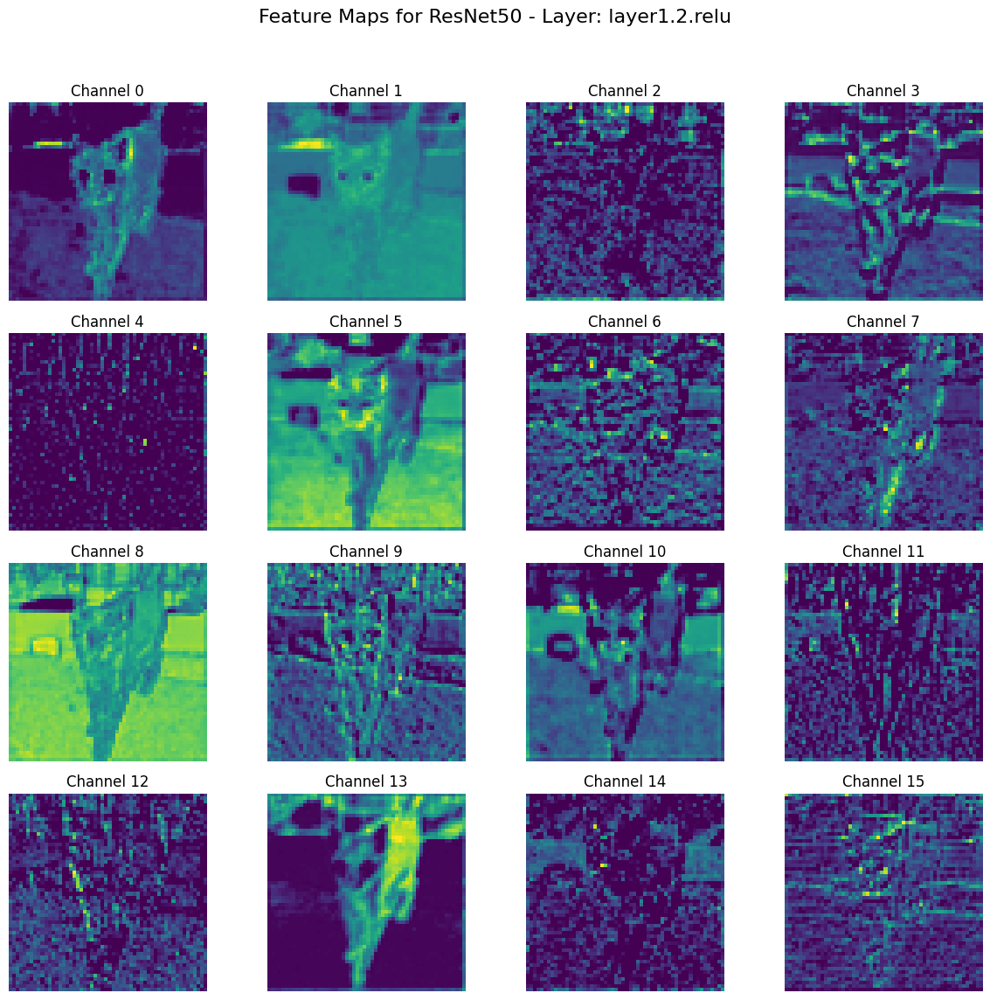

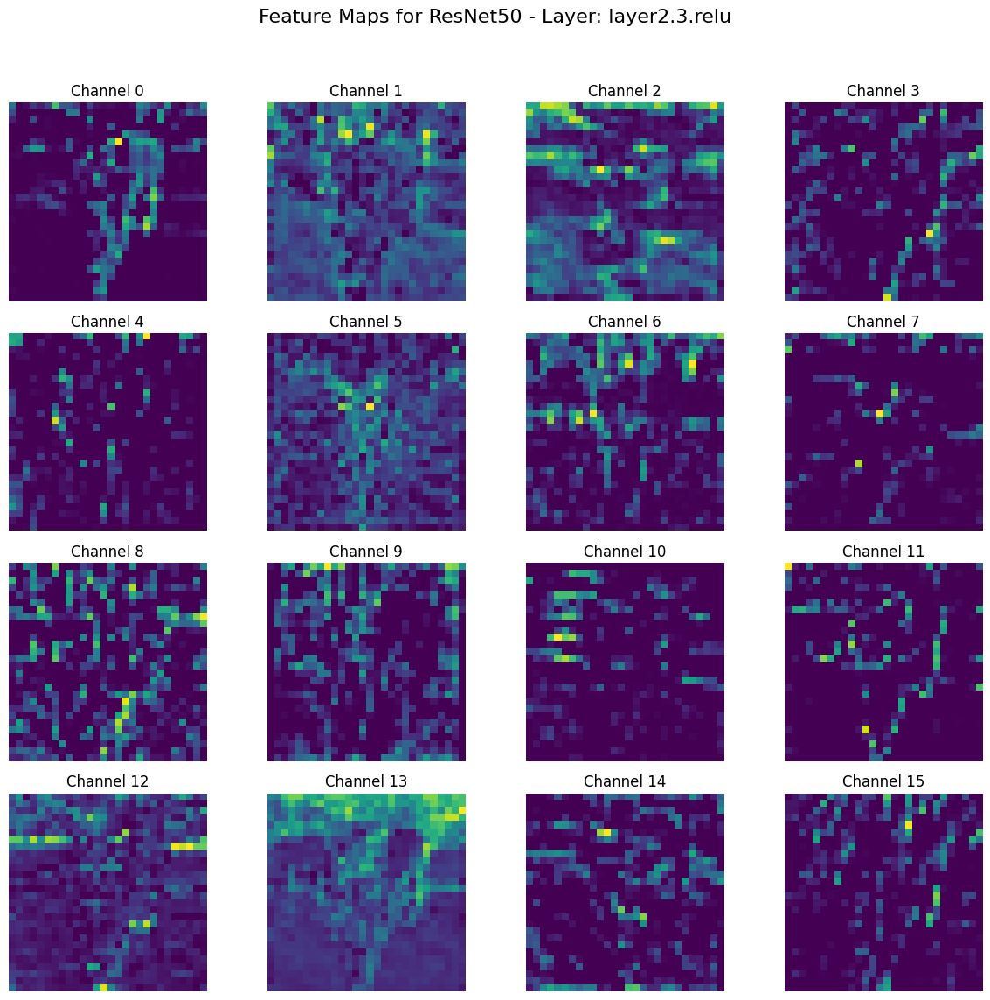

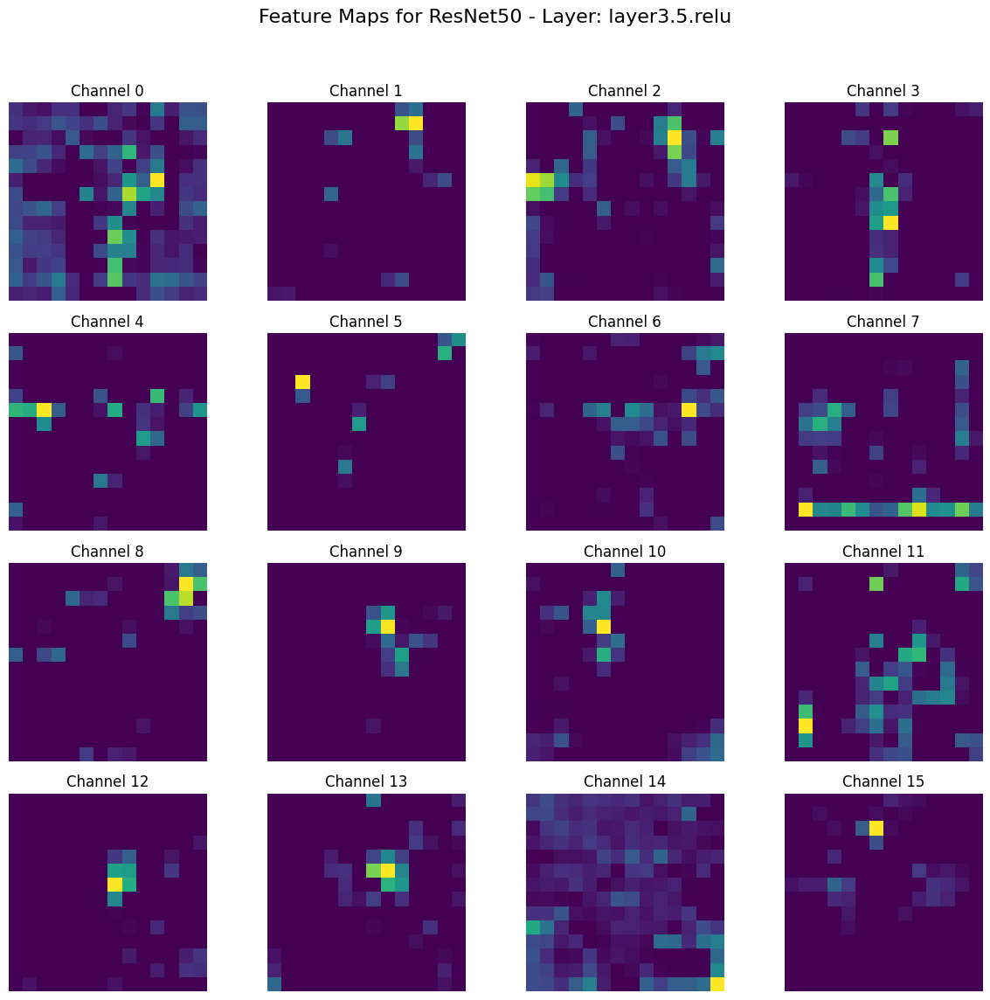

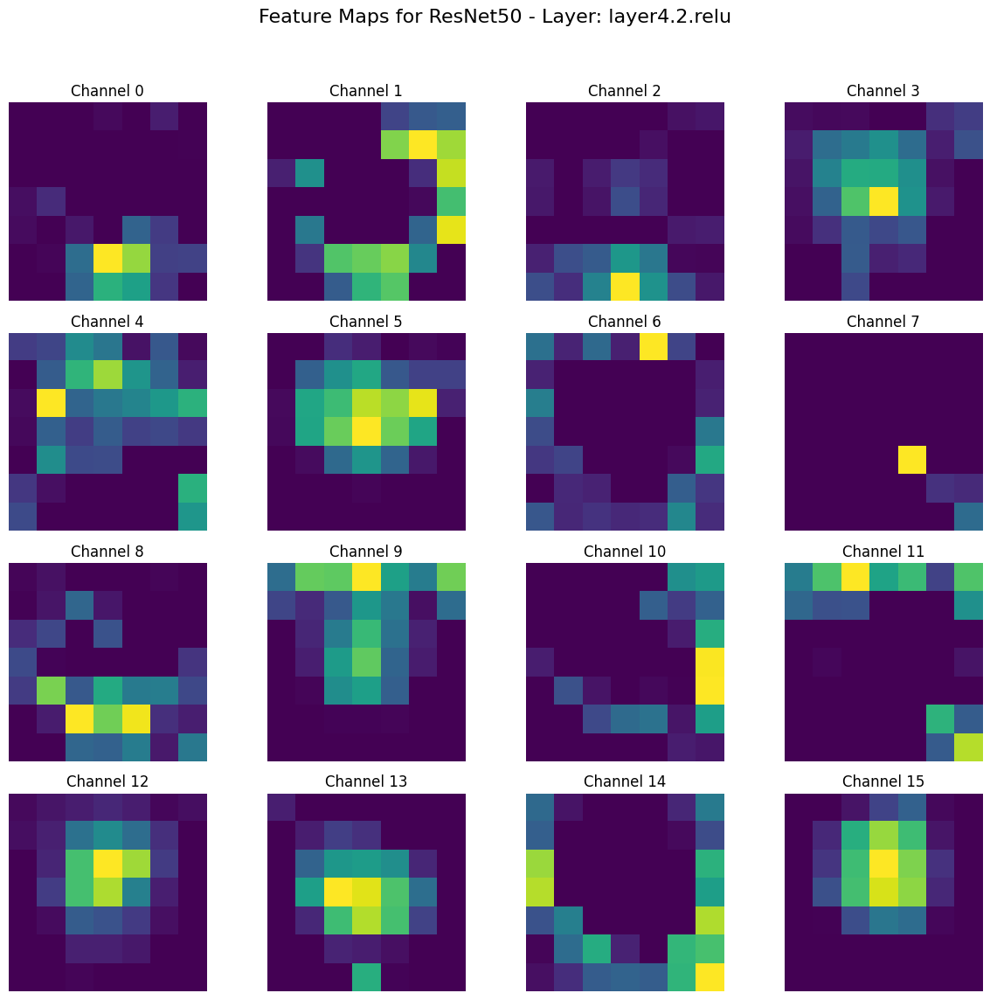

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Visualize ResNet50 feature maps using the existing function
visualize_feature_maps(resnet_feature_maps, 'ResNet50')

## Summary and Comparison of Feature Maps

For the two MobileNetV2 models tested:
We don't observe any substantial differences between the feature maps of the distilled and SimCLR students, so we treat them as one student model and compare with the teacher ResNet50.

1. **Hierarchy of features:**

Both models demonstrate a clear hierarchy of feature learning, moving from simple, generic features in early layers (edges, textures) to more complex, abstract, and semantically rich features in deeper layers.

*   **Early Layers:** basic low-level features such as edges, lines, and color gradients, might appear somewhat sparse or highlight strong contrasts in the input image.
*   **Mid-Layers:** the feature maps become more abstract. They start to represent more complex patterns and textures, such as corners, curves, or specific repetitive textures. The spatial resolution is reduced compared to early layers, but the number of channels increases for mobilenetV2.
*   **Deep Layers:** highly abstract and semantic information (uninterpretable). The spatial resolution is much lower, reflecting global patterns rather than local details.

2.  **Sparsity vs. Richness:** MobileNetV2's feature maps are sparser due to its architecture. ResNet50 shows richer, denser patterns in its feature maps.
3.  **Spatial Resolution:** Both models progressively decrease the spatial resolution of feature maps while increasing the number of channels. This is a common strategy in CNNs to capture larger receptive fields and abstract information.
